# Projeto - Módulo 2
Integrantes: Luana Nunes, Daiane Ribeiro de Souza, Sarah David Müzel e Paulo Muraro Ferreira

# Descrição  dos Dados

Esse trablho é sobre o dataset: Heart Failure Prediction, disponivel no **kaggle** <a href="https://www.kaggle.com/andrewmvd/heart-failure-clinical-data?select=heart_failure_clinical_records_dataset.csv"> </a>.

As doenças cardiovasculares (DCVs) são a causa número 1 de morte em todo o mundo, levando cerca de 17,9 milhões de vidas a cada ano, o que representa 31% de todas as mortes em todo o mundo.
A insuficiência cardíaca é um evento comum causado por DCVs e este conjunto de dados contém 12 recursos que podem ser usados para prever a mortalidade por insuficiência cardíaca.

A maioria das doenças cardiovasculares pode ser prevenida abordando os fatores de risco comportamentais, como uso de tabaco, dieta não saudável e obesidade, sedentarismo e uso nocivo de álcool, usando estratégias para toda a população.

Pessoas com doenças cardiovasculares ou que apresentam alto risco cardiovascular (devido à presença de um ou mais fatores de risco, como hipertensão, diabetes, hiperlipidemia ou doença já estabelecida) precisam de detecção e gerenciamento precoces, em que um modelo de aprendizado de máquina pode ser de grande ajuda.

<br>

**Artigo original: Davide Chicco, Giuseppe Jurman: "Machine learning can predict survival of patients with heart failure from serum creatinine and ejection fraction alone". BMC Medical Informatics and Decision Making 20, 16 (2020).**


# Conhecendo os Dados

In [7]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.widgets import Button, RadioButtons, CheckButtons
import numpy as np
import seaborn as sns
import plotly.figure_factory as ff
import plotly.express as px
import plotly.graph_objects as go

import statsmodels.api as sm
from statsmodels.formula.api import ols

from pandas_profiling import ProfileReport

import warnings
warnings.filterwarnings("ignore")

In [8]:
heart = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00519/heart_failure_clinical_records_dataset.csv")
heart.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [3]:
heart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


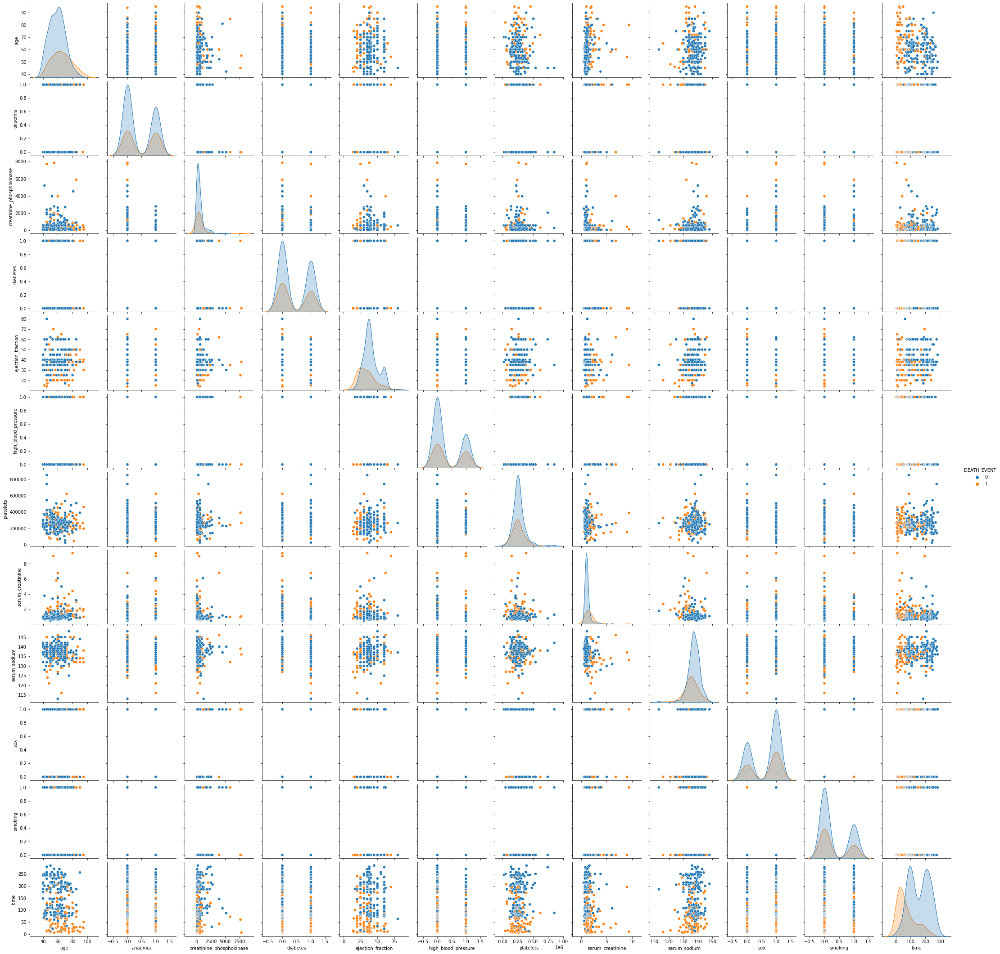

In [5]:
sns.pairplot(heart, hue='DEATH_EVENT');

Através de uma verificação dos dados, observa-se que:
- Não há presença de dados nulos
- que ao todo, tem-se os dados de 299 pacientes que sofreram um infarto
- foram analisados 12 fatores principais (variáveis de entrada).
- a variável resposta estudada é a morte dos pacientes que sofreram um infarto.

Os fatores análisados são:

- age: Idade dos pacientes 
- anaemia: Se os pacientes tem anemia (N=0, S=1)
- creatinine_phosphokinase: Nível da enzima CPK no sangue (mcg/L)
- diabetes: Se o paciente tem diabetes (N=0, S=1)
- ejection_fraction: Porcentagem de sangue saindo do coração a cada contração (porcentagem)  
- high_blood_pressure: Se o paciente tem pressão alta (N=0, S=1)
- platelets: Plaquetas no sangue (quilo de plaquetas/mL)   
- serum_creatinine: Nível de creatinina sérica no sangue (mg/dL)
- serum_sodium: Nível de sódio sérico no sangue (mEq/L)       
- sex: Sexo dos pacientes (M=0 e H=1)  
- smoking: Se o paciente é fumante (N=0, S=1)      
- time: Período de acompanhamento (dias)

A variável resposta análisada é:

- DEATH_EVENT: Se o paciente faleceu durante o período de acompanhamento



# Relatório dos dados

In [5]:
profile = ProfileReport(heart)

In [6]:
profile

Render HTML: 100%|██████████| 1/1 [00:04<00:00,  4.96s/it]


In [7]:
# salvando o relatório no disco
#profile.to_file(output_file="Relatorio - Dataset Heart Failure.html")

Export report to file: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


## Estatistica descritiva

In [5]:
heart.describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.00000,299.000000,299.000000,299.00000,299.000000,299.00000
mean,60.833893,0.431438,581.839465,0.418060,38.083612,0.351171,263358.029264,1.39388,136.625418,0.648829,0.32107,130.260870,0.32107
std,11.894809,0.496107,970.287881,0.494067,11.834841,0.478136,97804.236869,1.03451,4.412477,0.478136,0.46767,77.614208,0.46767
min,40.000000,0.000000,23.000000,0.000000,14.000000,0.000000,25100.000000,0.50000,113.000000,0.000000,0.00000,4.000000,0.00000
25%,51.000000,0.000000,116.500000,0.000000,30.000000,0.000000,212500.000000,0.90000,134.000000,0.000000,0.00000,73.000000,0.00000
50%,60.000000,0.000000,250.000000,0.000000,38.000000,0.000000,262000.000000,1.10000,137.000000,1.000000,0.00000,115.000000,0.00000
75%,70.000000,1.000000,582.000000,1.000000,45.000000,1.000000,303500.000000,1.40000,140.000000,1.000000,1.00000,203.000000,1.00000
max,95.000000,1.000000,7861.000000,1.000000,80.000000,1.000000,850000.000000,9.40000,148.000000,1.000000,1.00000,285.000000,1.00000


Por meio da estatistica descritiva, observa-se que os pacientes estudados tinham:
- Idade minima = 40 anos
- Idade Média = 60 anos 
- Idade máxima = 95 anos

Sendo que 75% do dataset consiste em pacientes com menos de 70 anos.

In [9]:
# Análisando variável resposta

qtdd_vivo = len(heart[heart["DEATH_EVENT"] == 0]) # determinar a quantidade de pacientes vivos
qtdd_mortos= len(heart[heart['DEATH_EVENT'] == 1])  # determinar a quantidade de pacientes que faleceram

print(f'Quantidade de pacientes que sobreviveram:{qtdd_vivo}\nQuantidade de pacientes que faleceram: {qtdd_mortos}')

Quantidade de pacientes que sobreviveram:203
Quantidade de pacientes que faleceram: 96


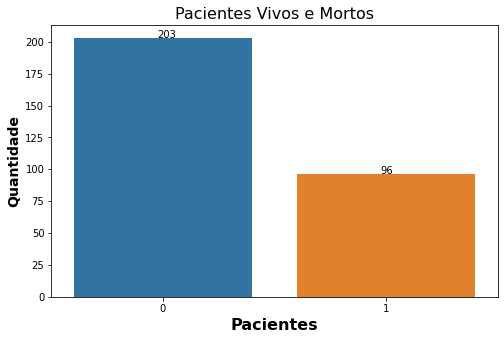

In [10]:
plt.figure (figsize= (8,5)) 
fig_mortes= sns.countplot(data=heart, x=heart["DEATH_EVENT"])

for p, label in zip(fig_mortes.patches, heart['DEATH_EVENT'].value_counts()):  # para add os rótulos nas barras
    fig_mortes.annotate(label, (p.get_x()+0.375, p.get_height()+0.15))
    
fig_mortes.set_title('Pacientes Vivos e Mortos', fontsize = 16)# nome do título
fig_mortes.set_ylabel('Quantidade', fontsize=14, fontweight = 'bold') # titulo do eixo y
fig_mortes.set_xlabel('Pacientes', fontsize=16, fontweight = 'bold') # titulo do eixo x

plt.show()

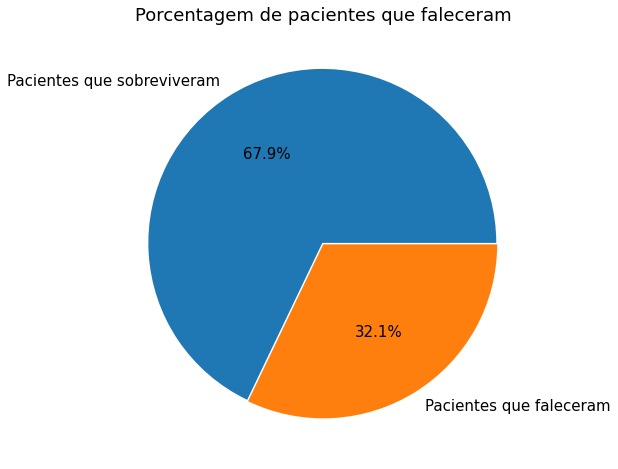

In [11]:
# Criando um gráfico de pizza para ver a distribuição dos dados
fig_porcentagem_mortes = heart['DEATH_EVENT'].value_counts()
plt.figure (figsize= (7,8)) # função do matplotlib que muda o tamanho da imagem
labels = ['Pacientes que sobreviveram', 'Pacientes que faleceram'] # colocar o nome em cada fatia
plt.axis ('equal') # para o gráfico sair circular e não oval
plt.title ('Porcentagem de pacientes que faleceram', fontsize=18)  # titulo do gráfico
explode = [0.01, 0] # deixar uma parte em evidencia

# autopct -> mostra os valores em %
plt.pie(fig_porcentagem_mortes, labels=labels, explode = explode, textprops={'fontsize': 15},autopct='%1.1f%%')
plt.show()

Analisando o dataset, verifica-se que dentre os 299 pacientes que sofreram infarto, 96 pacientes foram ao obito, o que representa aproximadamente 32% do total de pacientes.

## Correlação

- pearson : standard correlation coefficient
- kendall : Kendall Tau correlation coefficient
- spearman : Spearman rank correlation

<br>

* O coeficiente de correlação varia de `-1` a `1`. Se valor é próximo de 1, isto significa que existe uma forte correlação positiva entre as variáveis. Quando esse número é próximo de -1, as variáveis tem uma forte correlação negativa.
<br><br>
    -  **Resistência**: Quanto maior for o valor absoluto do coeficiente, mais forte é a relação entre as variáveis. Para a correlação de Pearson, um valor absoluto de 1 indica uma relação linear perfeita. A correlação perto de 0 indica que não há relação linear entre as variáveis.
<br><br>
    - **Direção** : O sinal de cada coeficiente indica a direção da relação. Se ambas as variáveis tendem a aumentar ou diminuir em conjunto, o coeficiente é positivo, e a linha que representa a correlação inclina para cima. Se uma variável tende a aumentar à medida que os outras diminuem, o coeficiente é negativo, e a linha que representa a correlação inclina para baixo.
    <br><br>
* Relação nula: r = 0
* Relação fraca: r ~ 0,3
* Relação moderada: r ~ 0,5
* Relação Forte: r > 0,7
 <br>

**Considere os seguintes pontos ao interpretar o coeficiente de correlação:**
* Nunca é adequado concluir que as mudanças em uma variável causam mudanças em outra variável com base apenas na correlação. Somente experimentos adequadamente controlados permitem que você determine se uma relação é causal.


* Um coeficiente de correlação de Pearson baixo não significa que não existe nenhuma relação entre as variáveis. As variáveis podem ter uma relação não linear.  Nesse caso é valido realizar uma análise da correlação de Spearman, a qual avalia a relação monotônica entre duas variáveis contínuas ou ordinais, ou seja, as variáveis tendem a mudar juntas mas não necessariamente a uma taxa constante. O coeficiente de correlação de Spearman baseia-se nos valores classificados de cada variável, em vez de os dados brutos.Outra análise possivel é a correlação de Kendall, que deve ser utilizada com dados ordinais de três ou mais níveis.

A correlação de Spearman, é uma medida de correlação não-paramétrica. Ao contrário do coeficiente de correlação de Pearson não requer a suposição que a relação entre as variáveis é linear, nem requer que as variáveis sejam quantitativas; pode ser usado para as variáveis medidas no nível ordinal. 

A correlação de Kendall é uma medida de associação para variáveis ordinais. Uma vantagem de Kendall sobre Spearman é que Kendall pode ser generalizado para um coeficiente de correlação parcial.



### Correlação de Pearson

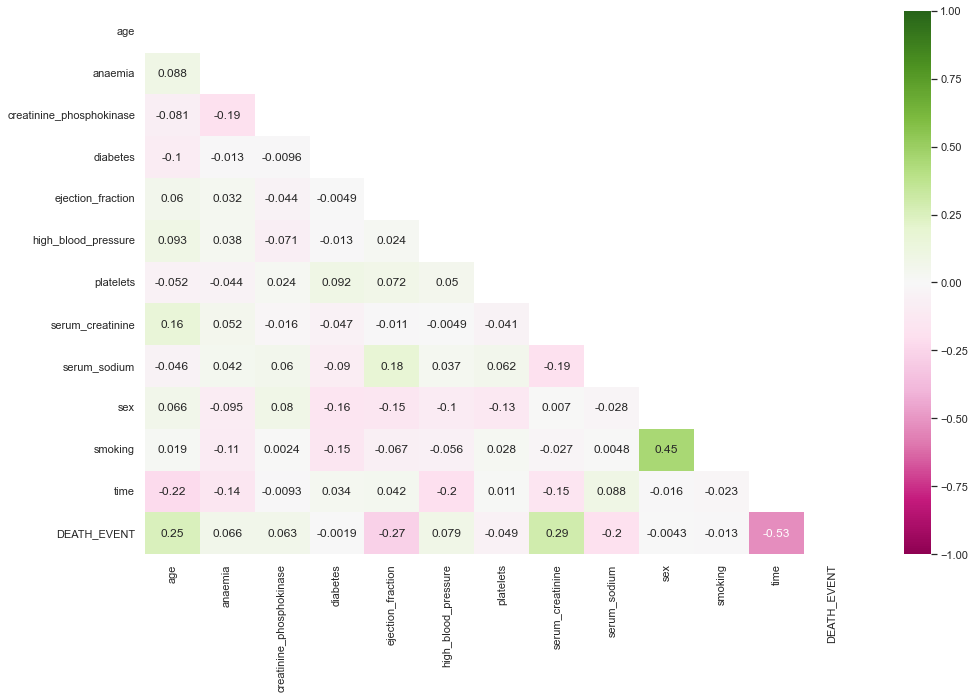

In [ ]:
# para facilitar a visualização dessa correlação podemos criar um gráfico usando o método heatmap seaborn
# no quai vai aparacer o valor de cada um das correlações  dentro dos quadrados.

# 1- gerando a correlação de Perason
correlacao_pearson = heart.corr()

#2- Gerando mapa heatmap
mask = np.zeros_like(correlacao_pearson)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(16,10))
    ax = sns.heatmap(correlacao_pearson, mask=mask, annot=True, vmin=-1, vmax=1,cmap="PiYG")

Pela correlação de Perason, observa-se que há correlações entre:
- smoking*sex = moderadas positiva
- time*death = moderadas negativa
- creatinine*death = fraca positiva
- age*death = fraca positiva
- enjection*death = fraca negativa

### Correlação de Spearman's 

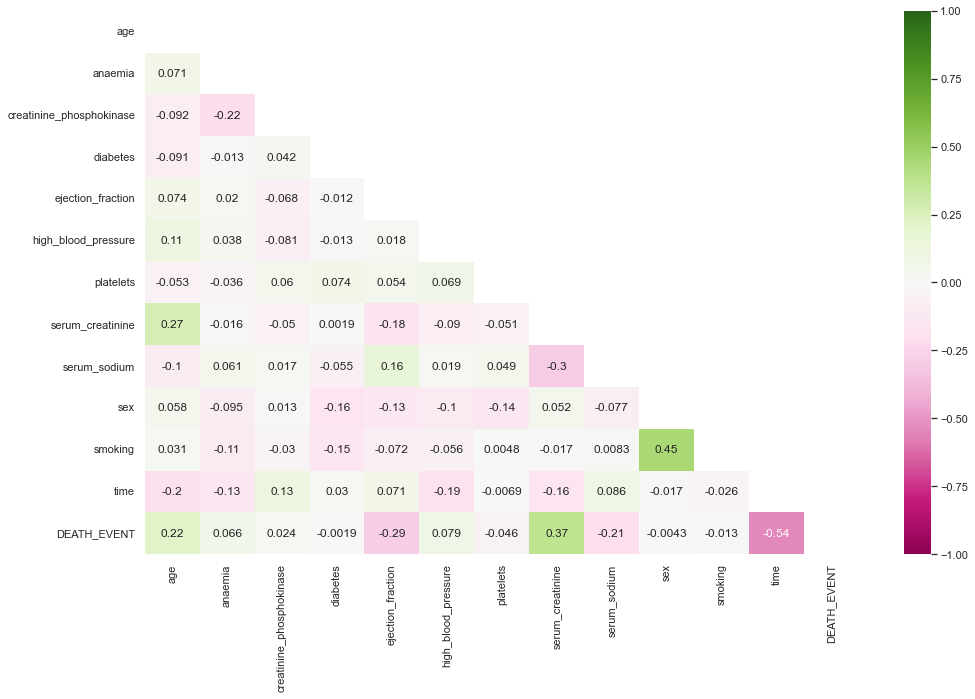

In [ ]:
# 1- gerando a correlação de Spearman
correlacao_spearman = heart.corr(method='spearman')

#2- Gerando mapa heatmap
mask = np.zeros_like(correlacao_spearman)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(16,10))
    ax = sns.heatmap(correlacao_spearman, mask=mask, annot=True, vmin=-1, vmax=1,cmap="PiYG")

Pela correlação de Spearman, observa-se que há correlações entre:

- smoking*sex = moderadas positiva
- time*death = moderadas negativa
- creatinine*death = fraca positiva
- enjection*death = fraca negativa
- sodium*creatinine = fraca negativa
- creatinine*age = fraca positiva

### Correlação de Kendall

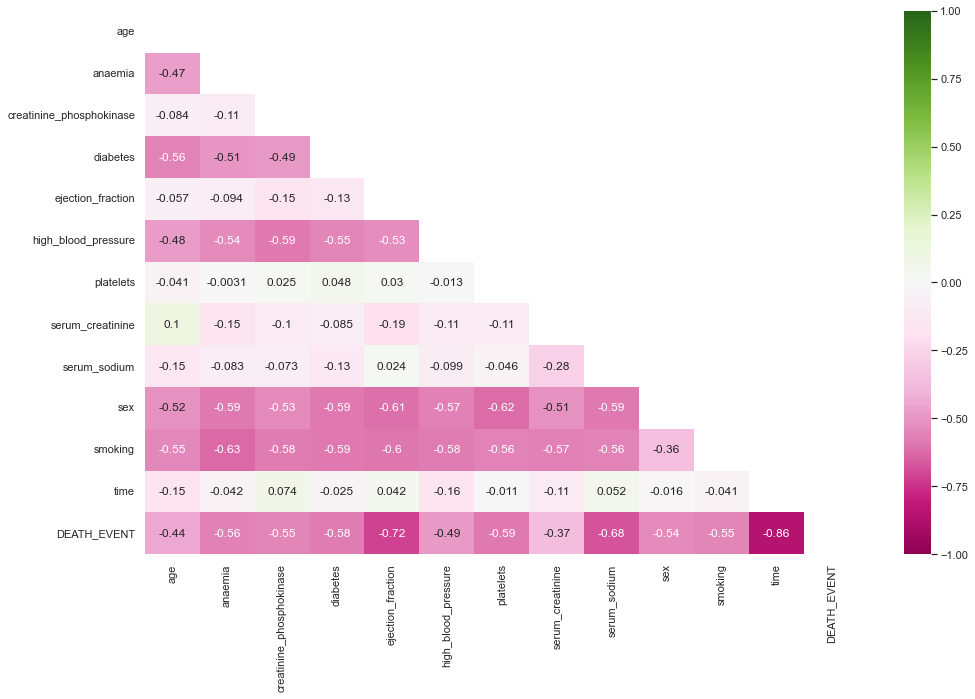

In [ ]:
# 1- gerando a correlação de kendall
correlacao_kendall = heart.corr(method='kendall')

#2- Gerando mapa heatmap
mask = np.zeros_like(correlacao_kendall)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(16,10))
    ax = sns.heatmap(correlacao_kendall, mask=mask, annot=True, vmin=-1, vmax=1,cmap="PiYG")

Pela correlação de Kendall, observa-se que:

- Death_event tem uam correlação negativa com todos os fatores estudados, sendo que 
    
    * creatinine = fraca
    
    * age = moderada
    * anemia = moderada
    * CPK= moderada
    * diabetes= moderada
    * hbp = moderada
    * plaquetas= moderada
    * sodium= moderada
    * sex= moderada
    * smoking=moderada
    
    * enjection = forte
    * time= forte
<br>
- Entre os fatores estudados nota-se que muitos de correlacionam negativamente, sendo os fatores que apresentam uma correlação são:
    * age 
    * anemia 
    * diabete
    * hbp
    * sex
    * smoking



# Análisando os óbitos ocorridos

Nesse estudo foram levantos 12 fatores  para compreender a relação dos infartos como hábitos (fumar), condições clinicas ( pressão sanguinea, anemia, etc) e sexo, idade, dentre outros.

## Idade

Análisando a idades dos pacientes infartados

In [12]:
# convertendo o tipo de dado da coluna age para inteiro
heart = heart.astype({"age": int})

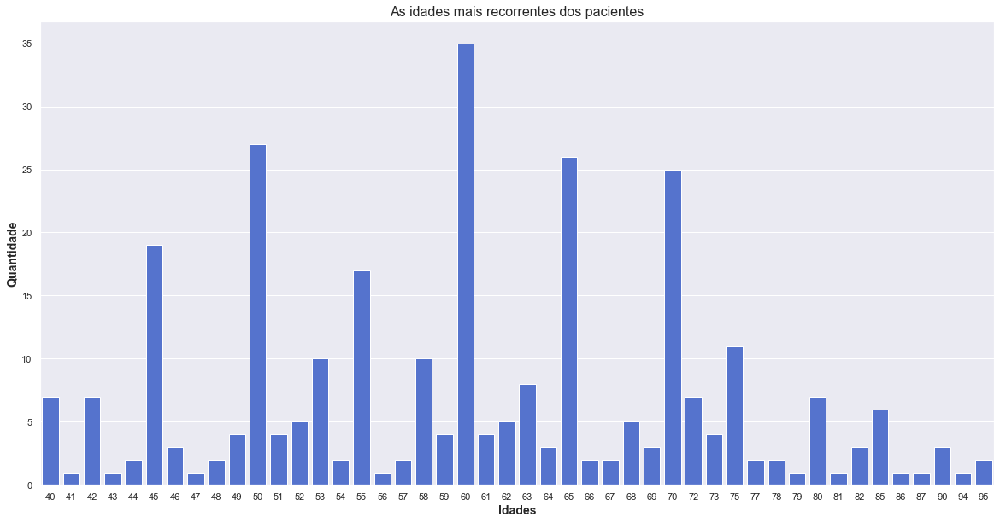

In [13]:
sns.set() # para trazer as configurações padrão do gráfico do seaborn que o colab não está importando
plt.figure(figsize= (20, 10)) # função do matplotlib que muda o tamanho da imagem
dist_age= sns.countplot(data=heart, x=heart['age'], palette=['#4169E1']) # criar gráfico


dist_age.set_title('As idades mais recorrentes dos pacientes', fontsize = 16)# nome do título
dist_age.set_ylabel('Quantidade', fontsize=14, fontweight = 'bold')
dist_age.set_xlabel('Idades', fontsize=14, fontweight = 'bold')

plt.show()

In [9]:
legenda = ['Sobrevintes', 'Falecidos']
fig1_hist_age=px.histogram(data_frame=heart,x="age",nbins=120,title="Idades dos pacientes que faleceram/sobreviveram",color="DEATH_EVENT")
fig1_hist_age.show()

Para compreender melhor a distribuição das faixas etárias dentro do grupo de pacientes análisado, os dados foram dividios em 5 grupos de idade.

In [14]:
heart['grupos_idades'] = pd.qcut(heart.age, 5, precision = 0)
heart.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT,grupos_idades
0,75,0,582,0,20,1,265000.00,1.9,130,1,0,4,1,"(70.0, 95.0]"
1,55,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1,"(50.0, 58.0]"
2,65,0,146,0,20,0,162000.00,1.3,129,1,1,7,1,"(63.0, 70.0]"
3,50,1,111,0,20,0,210000.00,1.9,137,1,0,7,1,"(39.0, 50.0]"
4,65,1,160,1,20,0,327000.00,2.7,116,0,0,8,1,"(63.0, 70.0]"


In [15]:
# verifiando os grupos criados e a quantidade de pacientes dentro de cada grupo
heart['grupos_idades'].value_counts()

(39.0, 50.0]    74
(63.0, 70.0]    66
(58.0, 63.0]    56
(70.0, 95.0]    52
(50.0, 58.0]    51
Name: grupos_idades, dtype: int64

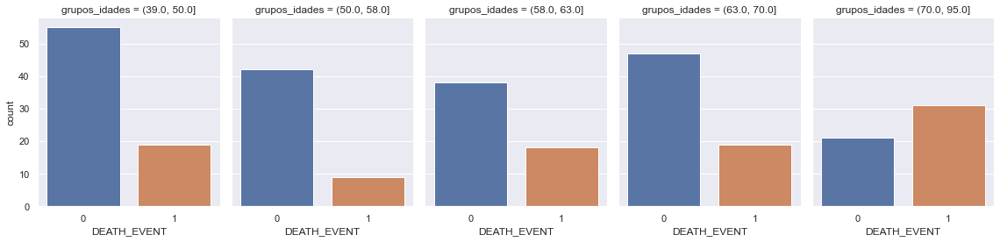

In [66]:
fig_idade = sns.catplot(x="DEATH_EVENT", col="grupos_idades", kind="count", data=heart, height=4, aspect=.8)
plt.show()

In [67]:
# análisando a porcentagem de mortes dentro de cada grupo etário
morte_por_idade = heart.groupby(['grupos_idades'])[['DEATH_EVENT']].apply(lambda x: x.sum()/heart[['DEATH_EVENT']].sum())
(morte_por_idade*100).style.format('{0:,.1f}%')

,DEATH_EVENT
grupos_idades,
"(39.0, 50.0]",19.8%
"(50.0, 58.0]",9.4%
"(58.0, 63.0]",18.8%
"(63.0, 70.0]",19.8%
"(70.0, 95.0]",32.3%


É possivel observar, a maioria dos óbitos ocorreu no grupo entre 70 e 95 anos de idade.

## Fumantes

In [16]:
qtd_fumantes = heart['smoking'].sum() # determinar a quantidade de fumantes
qtd_nao_fumantes = (heart['smoking'] == 0).sum() # determinar a quantidade de não fumantes

fumantes_mortos = len(heart[(heart['smoking']==1) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de fumantes que faleceram
fumantes_nao_mortos = len(heart[(heart['smoking']==1) & (heart['DEATH_EVENT']==0)]) # determinar a quantidade de fumantes que não faleceram

print(f'Quantidade de Fumantes: {qtd_fumantes} \nQuantidade de não-fumantes: {qtd_nao_fumantes}')
print(f'Quantidade de fumantes que faleceram: {fumantes_mortos} \nQuantidade fumantes que não faleceram: {fumantes_nao_mortos} ')


Quantidade de Fumantes: 96 
Quantidade de não-fumantes: 203
Quantidade de fumantes que faleceram: 30 
Quantidade fumantes que não faleceram: 66 


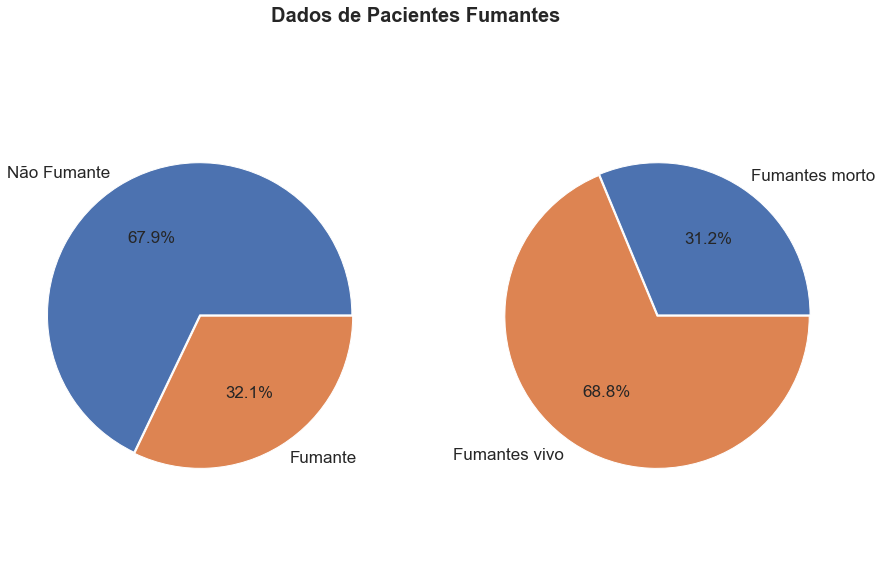

In [17]:
fig,ax=plt.subplots(1,2,figsize=(15,9))
plt.suptitle('Dados de Pacientes Fumantes', fontsize=20, fontweight='bold')

fumantes1 = heart['smoking'].value_counts()
fumantes2 = [fumantes_mortos, fumantes_nao_mortos]

labels1 = ['Não Fumante', 'Fumante'] 
labels2 = ['Fumantes morto', 'Fumantes vivo']
  

plt.axis ('equal') 
explode = [0.01, 0] 

ax[0].pie(fumantes1, labels=labels1, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
ax[1].pie(fumantes2, labels=labels2, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

## Pressão alta



In [18]:
qtd_hbp = heart['high_blood_pressure'].sum() # determinar a quantidade de pacientes com pressão alta
qtd_nao_hbp = (heart['high_blood_pressure'] == 0).sum() # determinar a quantidade de pacientes sem pressão alta

hbp_mortos = len(heart[(heart['high_blood_pressure']==1) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de pacientes com pressão alta que faleceram
hbp_nao_mortos = len(heart[(heart['high_blood_pressure']==1) & (heart['DEATH_EVENT']==0)]) # determinar a quantidade de pacientes sem pressão altas que não faleceram

print(f'Quantidade de pacientes com pressão alta: {qtd_hbp} \nQuantidade de pacientes sem pressão alta: {qtd_nao_hbp}')
print(f'Quantidade de pacientes com pressão alta que faleceram: {hbp_mortos} \nQuantidade pacientes com pressão alta que não faleceram: {hbp_nao_mortos} ')


Quantidade de pacientes com pressão alta: 105 
Quantidade de pacientes sem pressão alta: 194
Quantidade de pacientes com pressão alta que faleceram: 39 
Quantidade pacientes com pressão alta que não faleceram: 66 


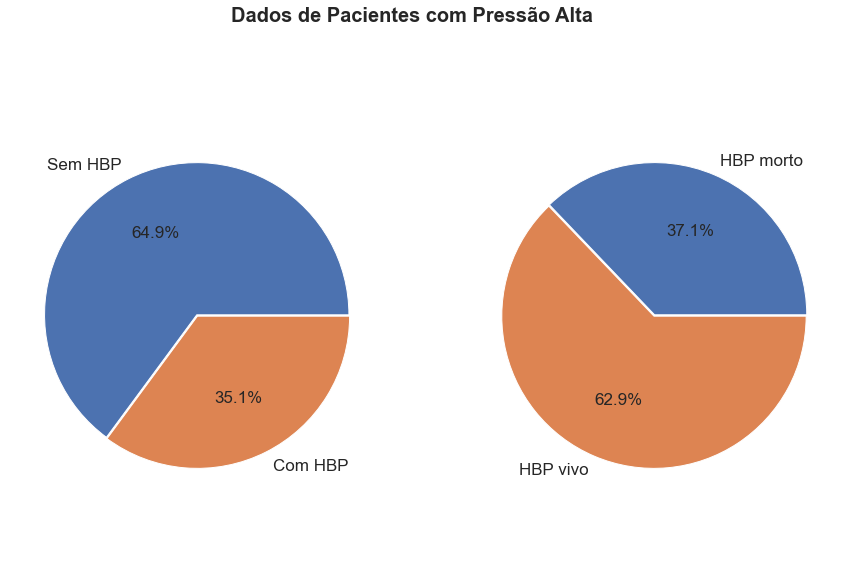

In [19]:
fig,ax=plt.subplots(1,2,figsize=(15,9))
plt.suptitle('Dados de Pacientes com Pressão Alta', fontsize=20, fontweight='bold')

hbp1 = heart['high_blood_pressure'].value_counts()
hbp2 = [hbp_mortos, hbp_nao_mortos]

labels1 = ['Sem HBP', 'Com HBP'] 
labels2 = ['HBP morto', 'HBP vivo']

plt.axis ('equal')
explode = [0.01, 0]

ax[0].pie(hbp1, labels=labels1, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
ax[1].pie(hbp2, labels=labels2, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

## Diabetes

In [20]:
qtd_diabeticos = heart['diabetes'].sum() #determinar a quantidade de pacientes com diabetes
qtd_nao_diabeticos = (heart['diabetes'] == 0).sum() # determinar a quantidade de pacientes sem diabetes

diabeticos_mortos = len(heart[(heart['diabetes']==1) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de pacientes com diabetes que faleceram
diabeticos_nao_mortos = len(heart[(heart['diabetes']==1) & (heart['DEATH_EVENT']==0)])# determinar a quantidade de pacientes sem diabetes que não faleceram

print(f'Quantidade de pacientes com diabetes: {qtd_diabeticos} \nQuantidade de pacientes sem diabetes: {qtd_nao_diabeticos}')
print(f'Quantidade de pacientes com diabetes que faleceram: {diabeticos_mortos} \nQuantidade pacientes com diabetes que não faleceram: {diabeticos_nao_mortos}')

Quantidade de pacientes com diabetes: 125 
Quantidade de pacientes sem diabetes: 174
Quantidade de pacientes com diabetes que faleceram: 40 
Quantidade pacientes com diabetes que não faleceram: 85


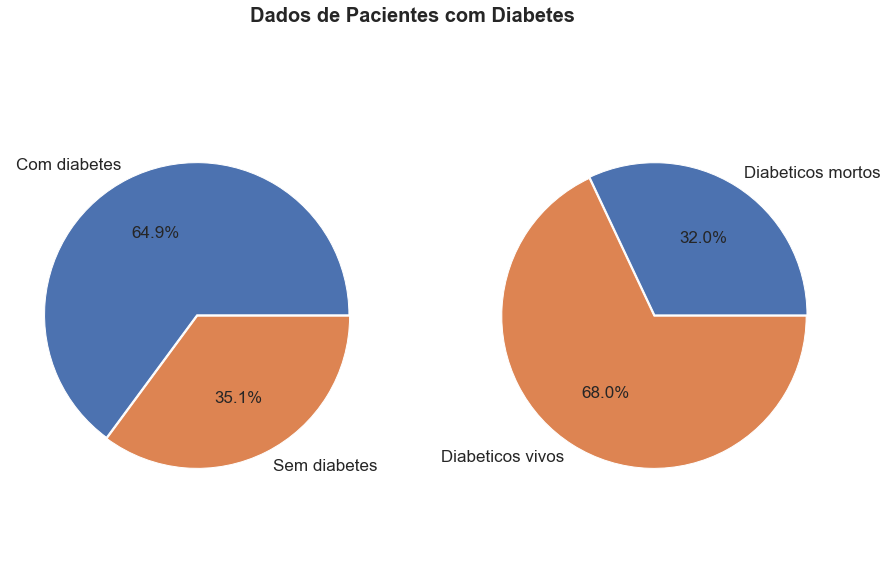

In [22]:
fig,ax=plt.subplots(1,2,figsize=(15,9))
plt.suptitle('Dados de Pacientes com Diabetes', fontsize=20, fontweight='bold')

diabete1 = heart['high_blood_pressure'].value_counts()
diabete2 = [diabeticos_mortos, diabeticos_nao_mortos]

labels1 = ['Com diabetes', 'Sem diabetes'] 
labels2 = ['Diabeticos mortos', 'Diabeticos vivos']

plt.axis ('equal')
explode = [0.01, 0]

ax[0].pie(diabete1, labels=labels1, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
ax[1].pie(diabete2, labels=labels2, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

## Sexo

In [24]:
qtd_H = (heart['sex'] ==1).sum() #determinar a quantidade de pacientes homens
qtd_M = (heart['sex'] == 0).sum() # determinar a quantidade de pacientes mulheres

H_mortos = len(heart[(heart['sex']==1) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de pacientes com diabetes que faleceram
M_mortos = len(heart[(heart['sex']==0) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de pacientes com diabetes que faleceram

H_nao_mortos = len(heart[(heart['sex']==1) & (heart['DEATH_EVENT']==0)])# determinar a quantidade de pacientes sem diabetes que não faleceram
M_nao_mortos = len(heart[(heart['sex']==0) & (heart['DEATH_EVENT']==0)])# determinar a quantidade de pacientes sem diabetes que não faleceram

print(f'Quantidade de pacientes homens: {qtd_H} \nQuantidade de pacientes mulheres: {qtd_M}')
print(f'Quantidade de pacientes homens que faleceram: {H_mortos} \nQuantidade pacientes homens que não faleceram: {H_nao_mortos}')
print(f'Quantidade de pacientes mulheres que faleceram: {M_mortos} \nQuantidade pacientes mulheres que não faleceram: {M_nao_mortos}')


Quantidade de pacientes homens: 194 
Quantidade de pacientes mulheres: 105
Quantidade de pacientes homens que faleceram: 62 
Quantidade pacientes homens que não faleceram: 132
Quantidade de pacientes mulheres que faleceram: 34 
Quantidade pacientes mulheres que não faleceram: 71


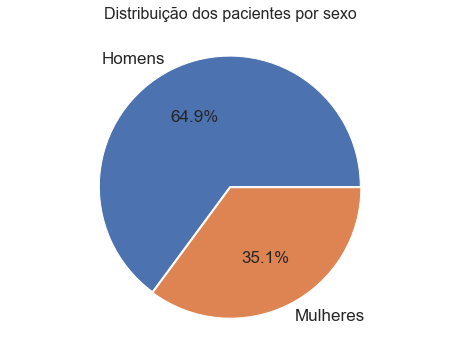

In [25]:
# % de pacientes por sexo

sexo = heart['sex'].value_counts()
plt.figure (figsize= (8, 6)) 
labels = ['Homens', 'Mulheres'] 
plt.axis ('equal') 
plt.title ('Distribuição dos pacientes por sexo', fontsize=16)  
explode = [0.01, 0] # deixar uma parte em evidencia
plt.pie(sexo, labels=labels, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

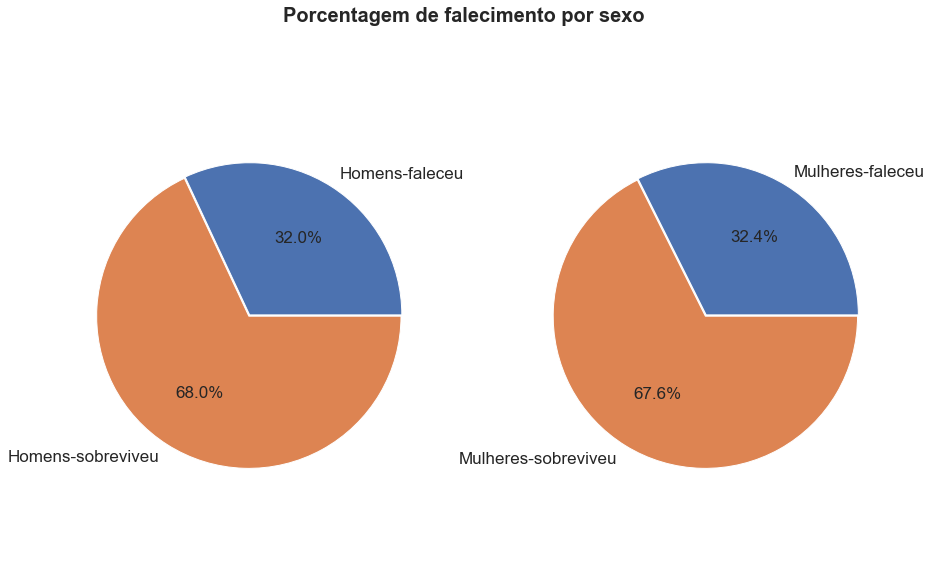

In [27]:
homens = [H_mortos, H_nao_mortos]
mulheres = [M_mortos, M_nao_mortos]

fig_sexo, ax = plt.subplots(1,2,figsize=(15, 9))
plt.suptitle('Porcentagem de falecimento por sexo', fontsize=20, fontweight='bold')
plt.axis ('equal') 
explode = [0.01, 0] 

label_H = ['Homens-faleceu', 'Homens-sobreviveu']
label_M = ['Mulheres-faleceu', 'Mulheres-sobreviveu']

ax[0].pie(homens, labels=label_H, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
ax[1].pie(mulheres, labels=label_M, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')

plt.show()   

## Anemia

In [23]:
qtd_anemicos = heart['anaemia'].sum() #determinar a quantidade de pacientes com diabetes
qtd_nao_anemicos = (heart['anaemia'] == 0).sum() # determinar a quantidade de pacientes sem diabetes

anemicos_mortos = len(heart[(heart['anaemia']==1) & (heart['DEATH_EVENT']==1)]) #  determinar a quantidade de pacientes com diabetes que faleceram
anemicos_nao_mortos = len(heart[(heart['anaemia']==1) & (heart['DEATH_EVENT']==0)])# determinar a quantidade de pacientes sem diabetes que não faleceram

print(f'Quantidade de pacientes com anemia: {qtd_anemicos} \nQuantidade de pacientes sem anemia: {qtd_nao_anemicos}')
print(f'Quantidade de pacientes com anemia que faleceram: {anemicos_mortos} \nQuantidade pacientes com anemia que não faleceram: {anemicos_nao_mortos}')


Quantidade de pacientes com anemia: 129 
Quantidade de pacientes sem anemia: 170
Quantidade de pacientes com anemia que faleceram: 46 
Quantidade pacientes com anemia que não faleceram: 83


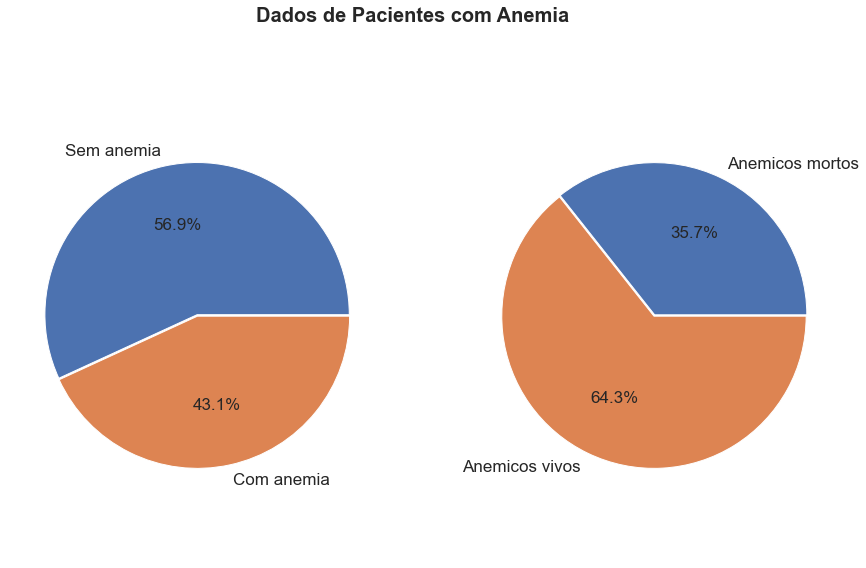

In [29]:
fig,ax=plt.subplots(1,2,figsize=(15,9))
plt.suptitle('Dados de Pacientes com Anemia', fontsize=20, fontweight='bold')

anemia1 = heart['anaemia'].value_counts()
anemia2 = [anemicos_mortos, anemicos_nao_mortos]

labels1 = ['Sem anemia', 'Com anemia'] 
labels2 = ['Anemicos mortos', 'Anemicos vivos']

plt.axis ('equal')
explode = [0.01, 0]

ax[0].pie(anemia1, labels=labels1, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
ax[1].pie(anemia2, labels=labels2, explode = explode, textprops={'fontsize': 17},autopct='%1.1f%%')
plt.show()

## creatinine_phosphokinase

In [4]:
heart['creatinine_phosphokinase'].describe()

count     299.000000
mean      581.839465
std       970.287881
min        23.000000
25%       116.500000
50%       250.000000
75%       582.000000
max      7861.000000
Name: creatinine_phosphokinase, dtype: float64

In [4]:
fig_hist_CPK = px.histogram(heart, x=heart['creatinine_phosphokinase'], nbins=70, marginal="box")
fig_hist_CPK.show()

In [5]:
hist2_CPK=px.histogram(heart,x="creatinine_phosphokinase",nbins=60,color="DEATH_EVENT",height=500,width = 900,marginal="violin")
hist2_CPK.show()

Os valores de referência da CPK são entre 30.00 U/L e 200.00 U/L para homens e entre 29.00 U/L e 168.00 U/L para mulheres. Resultados fora dessa faixa devem ser acompanhados por um médico. Valores baixos podem ocorrer em pessoas com baixa massa muscular, desnutridas e idosos.
CPK é a sigla para a creatinofosfoquinase, uma enzima do corpo humano que está presente nos músculos e em outros lugares do corpo, como o cérebro, o pulmão ou o coração. Quando elevada, essa enzima pode ser um marcador de infarto do miocárdio, miocardite, hipertermia e distrofia muscular.

## ejection_fraction

In [7]:
heart['ejection_fraction'].describe()

count    299.000000
mean      38.083612
std       11.834841
min       14.000000
25%       30.000000
50%       38.000000
75%       45.000000
max       80.000000
Name: ejection_fraction, dtype: float64

In [6]:
fig_hist_ef = px.histogram(heart, x=heart['ejection_fraction'], nbins=30, marginal="box")
fig_hist_ef.show()

In [7]:
ef=px.histogram(heart,x="ejection_fraction",nbins=30,color="DEATH_EVENT", marginal="violin")
ef.show()

In [8]:
fig_ef = px.pie(heart, values="DEATH_EVENT",names="ejection_fraction",
                title='Porcentagem de mortes em função da enjeção de sangue', width=900, height=700)
fig_ef.show()


## platelets

In [8]:
heart['platelets'].describe()

count       299.000000
mean     263358.029264
std       97804.236869
min       25100.000000
25%      212500.000000
50%      262000.000000
75%      303500.000000
max      850000.000000
Name: platelets, dtype: float64

In [70]:
fig_hist_plaquetas = px.histogram(heart, x=heart['platelets'], nbins=70, marginal="box")
fig_hist_plaquetas.show()

In [71]:
plaquetas=px.histogram(heart,x="platelets",nbins=30,color="DEATH_EVENT", marginal="violin")
plaquetas.show()

## serum_creatinine

In [10]:
heart['serum_creatinine'].describe()

count    299.00000
mean       1.39388
std        1.03451
min        0.50000
25%        0.90000
50%        1.10000
75%        1.40000
max        9.40000
Name: serum_creatinine, dtype: float64

In [72]:
fig_hist_SC = px.histogram(heart, x=heart['serum_creatinine'], nbins=70, marginal="box")
fig_hist_SC.show()

In [10]:
sc=px.histogram(heart, x="serum_creatinine",nbins=30,color="DEATH_EVENT", marginal="violin")
sc.show()

## serum_sodium

In [11]:
heart['serum_sodium'].describe()

count    299.000000
mean     136.625418
std        4.412477
min      113.000000
25%      134.000000
50%      137.000000
75%      140.000000
max      148.000000
Name: serum_sodium, dtype: float64

In [73]:
fig_hist_SS = px.histogram(heart, x=heart['serum_sodium'], nbins=70, marginal="box")
fig_hist_SS.show()

In [12]:
ss=px.histogram(heart,x="serum_sodium",nbins=30,color="DEATH_EVENT", marginal="violin")
ss.show()

In [ ]:
cols= ["#6daa9f","#774571"]
sns.kdeplot(heart, x="time", y="age", hue ="DEATH_EVENT", palette=cols)

## time

In [13]:
heart['time'].describe()

count    299.000000
mean     130.260870
std       77.614208
min        4.000000
25%       73.000000
50%      115.000000
75%      203.000000
max      285.000000
Name: time, dtype: float64

In [74]:
fig_hist_time = px.histogram(heart, x=heart['time'], nbins=70, marginal="box")
fig_hist_time.show()

In [14]:
ss=px.histogram(heart,x="time",nbins=30,color="DEATH_EVENT", marginal="violin")
ss.show()

# Anova

Para saber se há uma relação significativa dos dados foi realizada uma análise estatistica dos dados:

- one-way ANOVA
- two-way ANOVA


In [58]:
print ("IDADE")
age = ols('DEATH_EVENT ~ age', data = heart).fit()
aov_age = sm.stats.anova_lm(age, typ=2)
print (aov_age)
print ()

print ("ANEMIA")
anaemia = ols('DEATH_EVENT ~ anaemia', data = heart).fit()
aov_anaemia = sm.stats.anova_lm(anaemia, typ=2)
print (aov_anaemia)
print ()

print ("CPK")
cpk = ols('DEATH_EVENT ~ creatinine_phosphokinase', data = heart).fit()
aov_cpk = sm.stats.anova_lm(cpk, typ=2)
print (aov_cpk)
print ()

print ("DIABETES")
diabetes = ols('DEATH_EVENT ~ diabetes', data = heart).fit()
aov_diabetes = sm.stats.anova_lm(diabetes, typ=2)
print (aov_diabetes)
print ()

print ("ENJECTION FRACTION")
ef = ols('DEATH_EVENT ~ ejection_fraction', data = heart).fit()
aov_ef = sm.stats.anova_lm(ef, typ=2)
print (aov_ef)
print ()

print ("PRESSÃO ALTA")
hbp = ols('DEATH_EVENT ~ high_blood_pressure', data = heart).fit()
aov_hbp = sm.stats.anova_lm(hbp, typ=2)
print (aov_hbp)
print ()

print ("PLAQUETAS")
plaquetas = ols('DEATH_EVENT ~ platelets', data = heart).fit()
aov_plaquetas = sm.stats.anova_lm(plaquetas, typ=2)
print (aov_plaquetas)
print ()

print ("CREATININA")
sc = ols('DEATH_EVENT ~ serum_creatinine', data = heart).fit()
aov_sc = sm.stats.anova_lm(sc, typ=2)
print (aov_sc)
print ()

print ("SEXO")
sexo = ols('DEATH_EVENT ~ sex', data = heart).fit()
aov_sexo = sm.stats.anova_lm(sexo, typ=2)
print (aov_sexo)
print ()

print ("SÓDIO")
ss = ols('DEATH_EVENT ~ serum_sodium', data = heart).fit()
aov_ss = sm.stats.anova_lm(ss, typ=2)
print (aov_ss)
print ()

print ("FUMANTE")
fumante = ols('DEATH_EVENT ~ smoking', data = heart).fit()
aov_fumante = sm.stats.anova_lm(fumante, typ=2)
print (aov_fumante)
print ()

print ("TEMPO")
time = ols('DEATH_EVENT ~ time', data = heart).fit()
aov_time = sm.stats.anova_lm(time, typ=2)
print (aov_time)
print ()


IDADE
             sum_sq     df          F    PR(>F)
age        4.191100    1.0  20.410478  0.000009
Residual  60.986158  297.0        NaN       NaN

ANEMIA
             sum_sq     df         F    PR(>F)
anaemia    0.286241    1.0  1.310096  0.253299
Residual  64.891017  297.0       NaN       NaN

CPK
                             sum_sq     df         F    PR(>F)
creatinine_phosphokinase   0.256461    1.0  1.173259  0.279611
Residual                  64.920797  297.0       NaN       NaN

DIABETES
             sum_sq     df         F    PR(>F)
diabetes   0.000246    1.0  0.001121  0.973312
Residual  65.177011  297.0       NaN       NaN

ENJECTION FRACTION
                      sum_sq     df          F    PR(>F)
ejection_fraction   4.702392    1.0  23.094063  0.000002
Residual           60.474866  297.0        NaN       NaN

PRESSÃO ALTA
                        sum_sq     df         F    PR(>F)
high_blood_pressure   0.410394    1.0  1.881937  0.171149
Residual             64.766863  297

Oa fstores principais que se mostram influentes no falecimento dos pacientes são:
- age, ejection_fraction, serum_creatinine, serum_sodium e time.

In [59]:
#age+anaemia+creatinine_phosphokinase+diabetes+ejection_fraction+high_blood_pressure+platelets+serum_creatinine+serum_sodium+sex+smoking+time
dados = ols('DEATH_EVENT ~ age+anaemia+creatinine_phosphokinase+diabetes+ejection_fraction+high_blood_pressure+platelets+serum_creatinine+serum_sodium+sex+smoking+time ', data = heart).fit()
aov_dados = sm.stats.anova_lm(dados, typ=2)
print (aov_dados)

                             sum_sq     df          F        PR(>F)
age                        1.263445    1.0   9.505786  2.248255e-03
anaemia                    0.000490    1.0   0.003683  9.516486e-01
creatinine_phosphokinase   0.308769    1.0   2.323089  1.285716e-01
diabetes                   0.025496    1.0   0.191826  6.617318e-01
ejection_fraction          3.779970    1.0  28.439379  1.966594e-07
high_blood_pressure        0.012970    1.0   0.097584  7.549759e-01
platelets                  0.019073    1.0   0.143502  7.051055e-01
serum_creatinine           2.145106    1.0  16.139147  7.529471e-05
serum_sodium               0.304165    1.0   2.288450  1.314442e-01
sex                        0.206349    1.0   1.552506  2.137855e-01
smoking                    0.001685    1.0   0.012678  9.104293e-01
time                      11.779898    1.0  88.628478  1.648479e-18
Residual                  38.013185  286.0        NaN           NaN


Em conjunto os seguinte fatores apresentam interação significativa são:
- age, ejection_fraction, serum_creatinine, e time

Com base nisso serão feitas as análises conjuntas e pelas análises de correlção, serão análisados graficamente os seguintes fatores :

- age
- sex
- ejection_fraction
- serum_creatinine
- time




- serum creatinine and ejection fraction as the two most relevant features
- In particular, heart failure occurs when the heart is unable to pump enough blood to the body, and it is usually caused by diabetes, high blood pressure, or other heart conditions or diseases.

The patients consisted of 105 women and 194 men, and their ages range between 40 and 95 years old. All 299 patients had left ventricular systolic dysfunction and had previous heart failures that put them in classes III or IV of New York Heart Association (NYHA) classification of the stages of heart failure 

The dataset contains 13 features, which report clinical, body, and lifestyle information (Table 1), that we briefly describe here. Some features are binary: anaemia, high blood pressure, diabetes, sex, and smoking (Table 1). The hospital physician considered a patient having anaemia if haematocrit levels were lower than 36% [52]. Unfortunately, the original dataset manuscript provides no definition of high blood pressure [52].

Regarding the features, the creatinine phosphokinase (CPK) states the level of the CPK enzyme in blood. When a muscle tissue gets damaged, CPK flows into the blood. Therefore, high levels of CPK in the blood of a patient might indicate a heart failure or injury [68]. The ejection fraction states the percentage of how much blood the left ventricle pumps out with each contraction. The serum creatinine is a waste product generated by creatine, when a muscle breaks down. Especially, doctors focus on serum creatinine in blood to check kidney function. If a patient has high levels of serum creatinine, it may indicate renal dysfunction [69]. Sodium is a mineral that serves for the correct functioning of muscles and nerves. The serum sodium test is a routine blood exam that indicates if a patient has normal levels of sodium in the blood. An abnormally low level of sodium in the blood might be caused by heart failure [70]. The death event feature, that we use as the target in our binary classification study, states if the patient died or survived before the end of the follow-up period, that was 130 days on average [52]. The original dataset article [52] unfortunately does not indicate if any patient had primary kidney disease, and provides no additional information about what type of follow-up was carried out. Regarding the dataset imbalance, the survived patients (death event = 0) are 203, while the dead patients (death event = 1) are 96. In statistical terms, there are 32.11% positives and 67.89% negatives.

Current study is based on 299 patients of heart failure comprising of 105 women and 194 men. All the patients were more than 40 years old, having left ventricular systolic dysfunction and falling in NYHA class III and IV. Follow up time was 4–285 days with an average of 130 days. Disease was diagnosed by cardiac echo report or notes written by physician. Age, serum sodium, serum creatinine, gender, smoking, Blood Pressure (BP), Ejection Fraction (EF), anemia, platelets, Creatinine Phosphokinase (CPK) and diabetes were considered as potential variables explaining mortality caused by CHD. Age, serum sodium and CPK are continuous variables whereas EF, serum creatinine and platelets were taken as categorical variables. EF was divided into three levels (i.e. EF≤30, 30<EF≤45 and EF>45) and platelets was also divided into three level on the basis of quartiles. Serum creatinine greater than its normal level (1.5) is an indicator of renal dysfunction. Its effect on mortality was studied as creatinine >1.5 vs ≤1.5. Anemia in patients was assessed by their haematocrit level. Following McClellan et al. [4] the patients with haematocrit less than 36 (minimum normal level of haematocrit) were taken as anemic. The information related to risk factors were taken from blood reports while smoking status and blood pressure were taken from physician’s notes.

Age, renal dysfunction, blood pressure, ejection fraction and anemia were found as significant risk factors for mortality among heart failure patients.


As descobertas que parecem surpreendentes não são significativas sobre tabagismo e diabetes. No entanto, resultados semelhantes sobre diabetes e tabagismo também foram relatados em outros estudos [24–25]. A razão por trás disso pode ser tabagismo e diabetes são basicamente causas de problemas cardíacos nos estágios iniciais. Estávamos preocupados apenas com os pacientes em classe III e IV da NYHA, que estão em estágios avançados de insuficiência cardíaca. Até esses estágios, esses fatores (diabetes e tabagismo) podem provavelmente ser controlados por medicamentos e, portanto, esses fatores não têm efeito significativo sobre as mortes por insuficiência cardíaca nas classes III e IV.

It can be concluded that growing age, renal dysfunction (having serum creatinine greater than its normal level 1.5), high BP (higher than normal range), higher level of anaemia and lower values of ejection fraction (EF) are the key factors contributing towards increased risk of mortality among heart failure patients. Increased level of serum sodium can reduce the odds of death. No significant differences were found due to smoking status, diabetes and gender of patients.

# Análise das combinações

## Análise: sexo, idade e morte

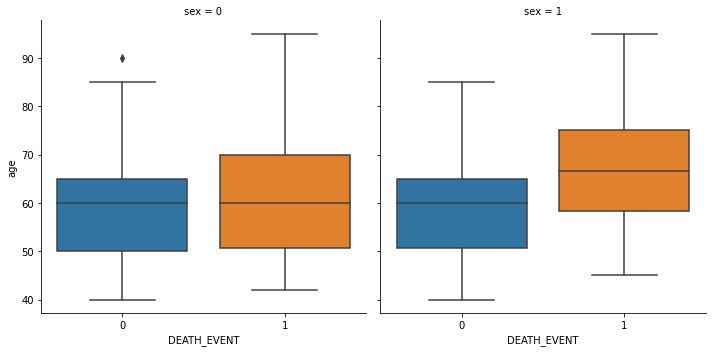

In [37]:
sns.catplot(x="DEATH_EVENT", y="age", col="sex", kind="box", data=heart)
plt.show()

## Análise: sexo, tempo, morte

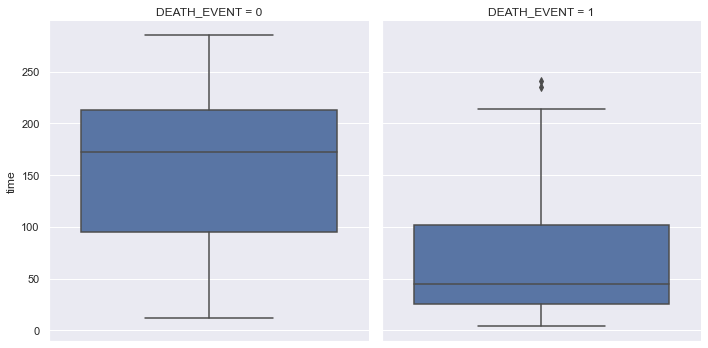

In [115]:
sns.catplot(y="time", col="DEATH_EVENT", kind="box", data=heart)
plt.show()

## Análise: serum creatinine e  ejection fraction

In [75]:
fig = px.scatter(heart, x="serum_creatinine", y="ejection_fraction", color="DEATH_EVENT", marginal_y="box",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()


In [12]:
fig = px.scatter(heart, x="ejection_fraction", y="serum_creatinine", color="DEATH_EVENT", marginal_y="box",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()


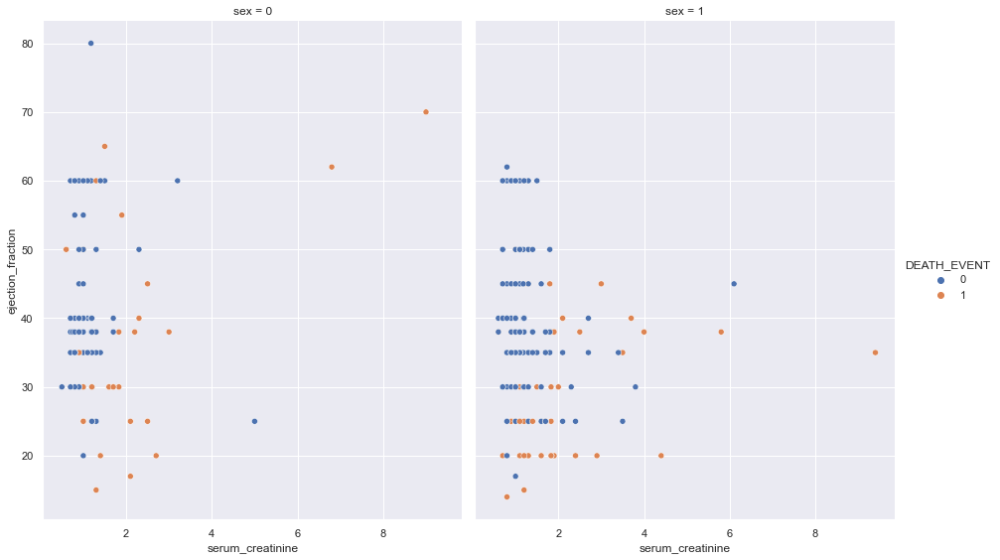

In [122]:
sns.relplot(x="serum_creatinine", y="ejection_fraction", col="sex", hue="DEATH_EVENT", height=8, aspect=0.8, data=heart)
plt.show()

# Gráfico Interativo

In [12]:
df2 = pd.get_dummies(heart, columns=['sex']).rename(columns={"sex_1": "male", "sex_0": "female"})

df3 = pd.get_dummies(pd.cut(df2.age, [40,50,60,70,95]))

df2["grupo_1"] = df3.iloc[:,0]
df2["grupo_2"] = df3.iloc[:,1]
df2["grupo_3"] = df3.iloc[:,2]
df2["grupo_4"] = df3.iloc[:,3]

df = df2[['DEATH_EVENT', 'male','female','smoking','anaemia', 'diabetes', 'high_blood_pressure','grupo_1','grupo_2','grupo_3','grupo_4']]

In [13]:
cond = ['DEATH_EVENT', 'male','female','smoking','anaemia', 
        'diabetes', 'high_blood_pressure','grupo_1','grupo_2','grupo_3','grupo_4']

def prob11(q):
    lista = []
    num = []
    for i in range(11):
        num.append(q[i])
    
    if not any(num[1:]):
        return 0
    else: 
        for i in range(11):
            if q[i]:
                lista.append(cond[i])
        return lista


def texto_query(q):
    if not any(q[1:]):
        return False
    else: 
        lista9 = prob11(q).copy()
        for i in ['DEATH_EVENT']:
            if i in lista9:
                lista9.remove(i)
        if not lista9:
            return False

        else:
            if 'male' in lista9 and 'female' in lista9:
                if len(lista9)==2:
                    return False
                else:
                    lista9.remove('male')
                    lista9.remove('female')
            
            st = st1 = ''
            
            if lista9[0] not in ['grupo_1','grupo_2','grupo_3','grupo_4']:
                st = lista9[0] + '==1'
                for i in lista9[1:]:
                    if i not in ['grupo_1','grupo_2','grupo_3','grupo_4']:
                        st = st + ' & ' + i + '==1'
     
            if sum(q[-4::]) >=1:
                grupos = list(set(prob11(q)).intersection(set(['grupo_1','grupo_2','grupo_3','grupo_4'])))
                #st = st + ' & ('
                st1 = '(' + grupos[0] + '==1'
                for i in grupos[1:]:
                    st1 = st1 + ' | ' + i + '==1' 
                st1 = st1 + ')'
            
            if st!='' and st1!='':
                return st + ' & ' + st1 
            elif st!='' and st1=='':
                return st
            elif st=='' and st1!='':
                return st1

def texto_query_morte(q):
    if not any(q[1:]):
        return False
    else: 
        lista9 = prob11(q).copy()
        for i in []:
            if i in lista9:
                lista9.remove(i)
        if not lista9:
            return False

        else:
            if 'male' in lista9 and 'female' in lista9:
                if len(lista9)==2:
                    return False
                else:
                    lista9.remove('male')
                    lista9.remove('female')
            
            st = st1 = ''
            
            if lista9[0] not in ['grupo_1','grupo_2','grupo_3','grupo_4']:
                st = lista9[0] + '==1'
                for i in lista9[1:]:
                    if i not in ['grupo_1','grupo_2','grupo_3','grupo_4']:
                        st = st + ' & ' + i + '==1'
     
            if sum(q[-4::]) >=1:
                grupos = list(set(prob11(q)).intersection(set(['grupo_1','grupo_2','grupo_3','grupo_4'])))
                #st = st + ' & ('
                st1 = '(' + grupos[0] + '==1'
                for i in grupos[1:]:
                    st1 = st1 + ' | ' + i + '==1' 
                st1 = st1 + ')'
            
            if st!='' and st1!='':
                return st + ' & ' + st1 
            elif st!='' and st1=='':
                return st
            elif st=='' and st1!='':
                return st1
            
            
            
def prob1(q):
    if not texto_query(q):
        return 100
    else:
        return 100*len(df.query(texto_query(q)))/len(heart)

def prob2(q):        
    if not texto_query(q):
        return 100*len(df.query('DEATH_EVENT==1'))/len(heart)
    else:
        return 100*len(df.query(texto_query_morte(q)))/len(heart)

def qtd_pacientes(q):   
    if not texto_query(q):
        return len(heart)
    else:
        return len(df.query(texto_query(q)))

def qtd_mortos(q):   
    if not texto_query(q):
        return len(df.query('DEATH_EVENT==1'))
    else:
        return len(df.query(texto_query_morte(q)))


def prob_morrer(q):       
    if not texto_query(q):
        return 100*len(df.query('DEATH_EVENT==1'))/len(heart)
    else:
        return 100*len(df.query(texto_query_morte(q)))/len(df.query(texto_query(q)))

<IPython.core.display.Javascript object>


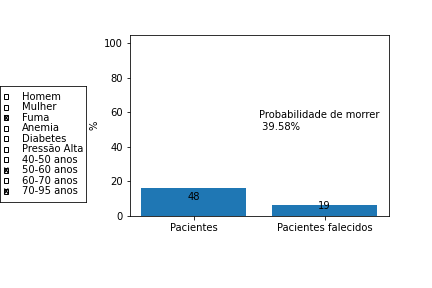

In [14]:
%matplotlib notebook
q = [True, False, False ,False, False, False, False, False, False, False, False]
x = ['Pacientes', 'Pacientes falecidos']
y = [prob1(q), prob2(q)]

fig = plt.figure()
ax = fig.subplots()
plt.subplots_adjust(left = 0.3, bottom = 0.25)
p1, p2 = ax.bar(x, y, label = 'Plot 1')
#plt.ylim((0,100))
ax.set_ylabel('%')

plots =[p1, p2]
activated = [False, False ,False, False, False, False, False, False, False, False] #define quais botões começam ativados
labels = ['Homem','Mulher','Fuma','Anemia','Diabetes','Pressão Alta','40-50 anos','50-60 anos','60-70 anos',
          '70-95 anos']

ax_check = plt.axes([0, 0.3, 0.2, 0.4])
plot_button = CheckButtons(ax_check,labels, activated)

texto = ax.text(.5, 50,'', fontsize=10)

height1 = p1.get_height()
alt1 = ax.text(p1.get_x() + p1.get_width() / 2.0, height1/2, f'{round(qtd_pacientes(q),2)}', ha='center', va='bottom')

height2 = p2.get_height()
alt2 = ax.text(p2.get_x() + p2.get_width() / 2.0, height2/2, f'{round(qtd_mortos(q),2)}', ha='center', va='bottom')

def select_plot(label):
    
    index = labels.index(label)
    q[index+1] = not q[index+1]
    y = [prob1(q), prob2(q)]
    p1.set_height(y[0])
    p2.set_height(y[1])
    texto.set_text(f'Probabilidade de morrer \n {round(prob_morrer(q),2)}%')
       
    alt1.set_position((0,p1.get_height()/2))
    alt2.set_position((1,p2.get_height()/2))
    
    alt1.set_text(f'{round(qtd_pacientes(q),2)}')
    alt2.set_text(f'{round(qtd_mortos(q),2)}')
    
    plt.draw() 

plot_button.on_clicked(select_plot)
plt.show()